This tutorial will provide an overview of the dataset structure.

In [ ]:
# Import dataset based eme

import os
import sys
root_path = os.path.abspath("../..")
em_simulator_path = root_path
print(em_simulator_path)
sys.path.append(em_simulator_path)

import em_simulation as sim

In [2]:
from IPython.display import Image
import pickle

The dataset consists of three components: dataset_info.py, wg_crosssection.lms, and several pickle files. Once you have the path to the dataset folder, you can use the dataset by passing this path as a parameter to the DataUpdater class.

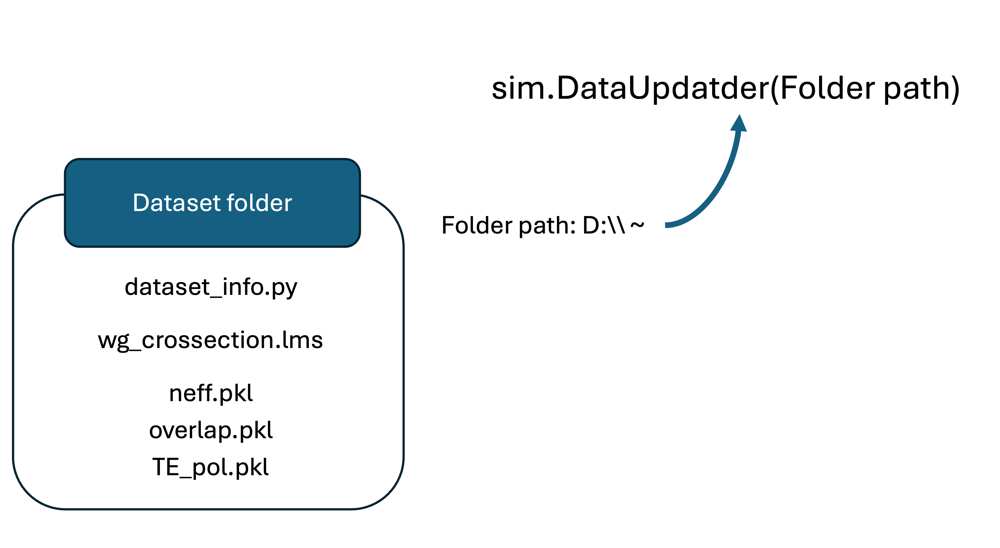

In [3]:
Image(filename="./imgs/dataset_structure.png", width=600)


In [4]:
sample_dataset_path = root_path + "/sample_datasets/Si_rectangular_single_waveguide"
sample_dataset = sim.DataUpdater(sample_dataset_path, is_testmode=True)

dataset_info.py stores metadata about the dataset, such as the parameter space and resolution, as well as functions that provide information about the dataset.

*The parameter names defined in dataset_info.py, the corresponding user properties in the 'model' section of wg_crosssection.lms, and the name convention for code in the Parameter Space Template class must all be consistent.*

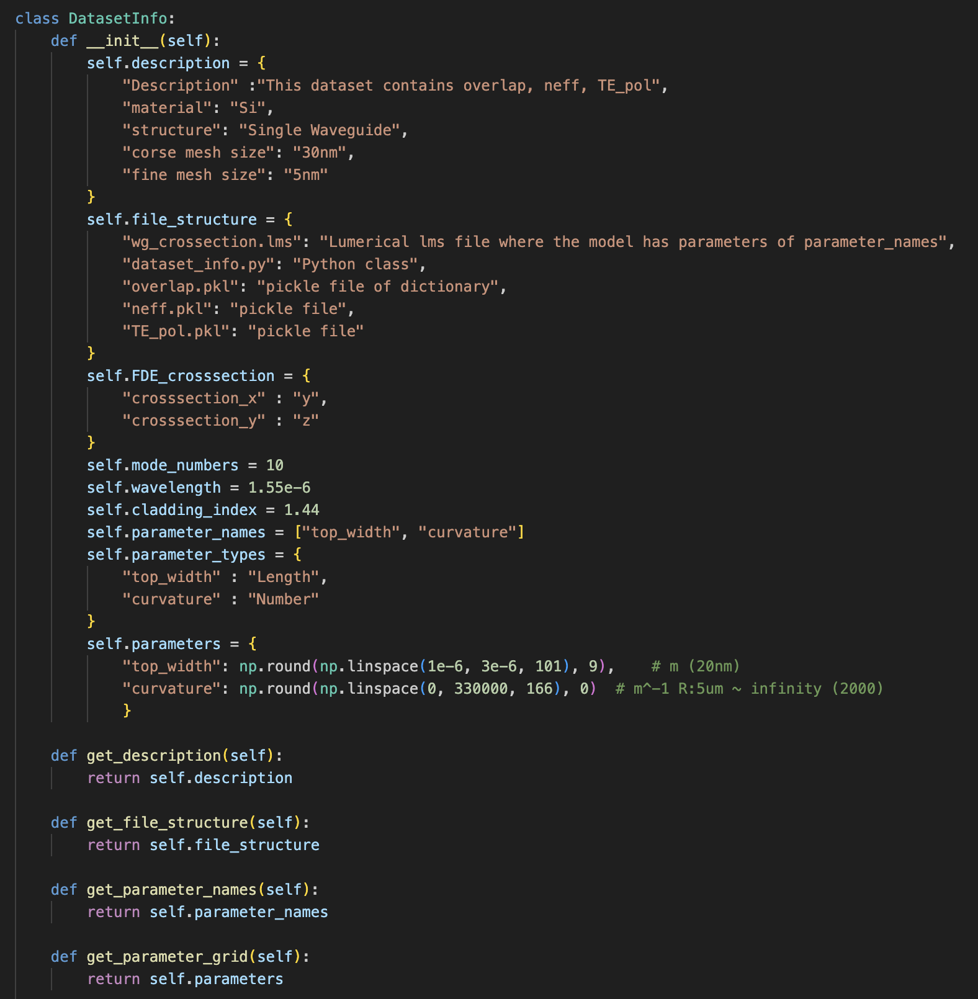

In [5]:
Image(filename="./imgs/dataset_info_image.png", width = 600)

wg_crosssection.lms is the FDE simulation file used to obtain eigenmode information during dataset updates. Currently, we use the Lumerical FDE solver, and the data processing code is based on the Lumerical data format and API. Therefore, to update the dataset or create your own, you must have a valid Lumerical license.

Parameters within the dataset’s parameter space should be controlled through the ‘model’ section of the wg_crosssection.lms file. For example, in the sample dataset, the parameter space includes “curvature” and “top_width”. These values are set in the User properties of the ‘model’, and modifying them updates the corresponding geometrical structure in wg_crosssection.lms.

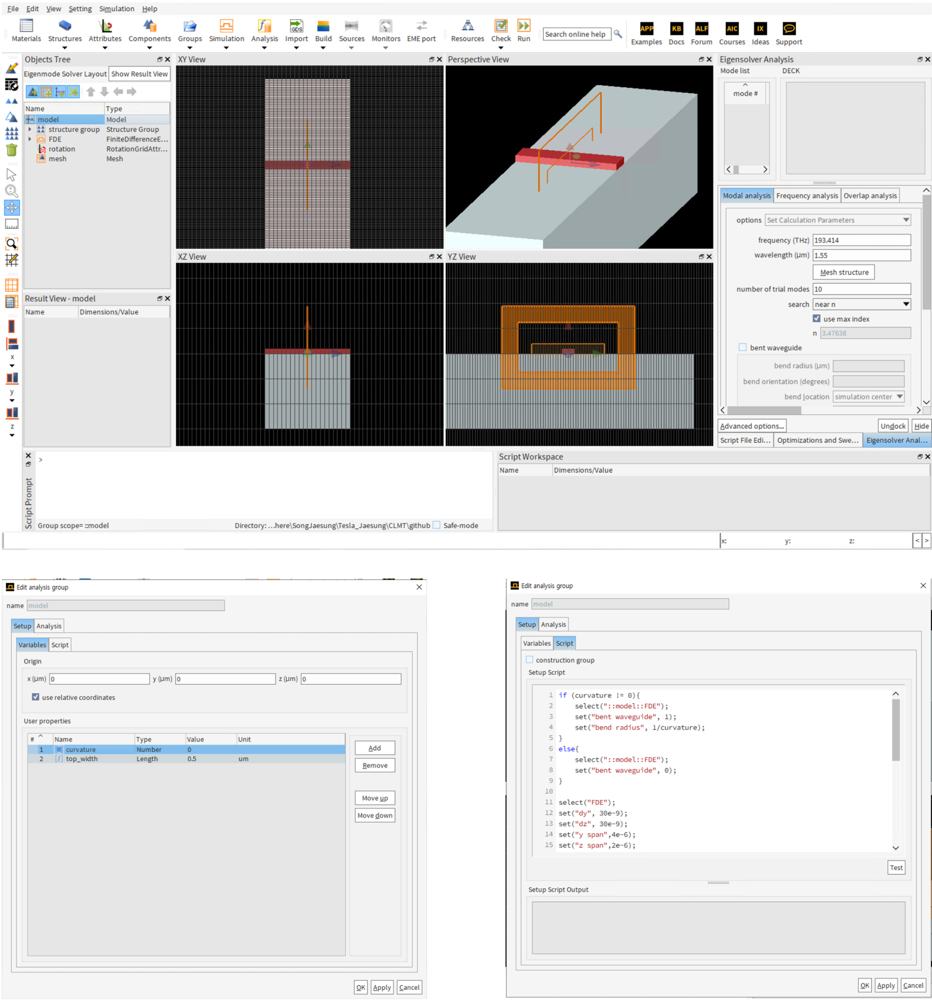

In [6]:
Image(filename="./imgs/wg_crosssection_img.png", width = 1000)

The pickle files—neff, TE_pol, and overlap—store the raw data used in the dataset-based EME simulation. When you populate or update the dataset, these files are automatically updated. Each file is structured as a Python dictionary, with keys corresponding to specific parameter positions within the parameter space. The values store the effective index, TE polarization fraction, and overlap between parameter points, respectively.

In [7]:
print("type of neff:", type(sample_dataset.neff))
print("type of TE_pol:", type(sample_dataset.TE_pol))
print("type of overalp:", type(sample_dataset.overlap))

print("\nkeys of neffs: ", sample_dataset.neff.keys())
print("values of neffs: ", sample_dataset.neff.values())

type of neff: <class 'dict'>
type of TE_pol: <class 'dict'>
type of overalp: <class 'dict'>

keys of neffs:  dict_keys([(1e-06, 0.0), (1.02e-06, 0.0), (1e-06, 2000.0), (1e-06, 4000.0), (1.02e-06, 4000.0), (1e-06, 6000.0), (1e-06, 8000.0), (1.02e-06, 8000.0), (1e-06, 10000.0), (1e-06, 12000.0), (1.02e-06, 12000.0), (1e-06, 14000.0), (1e-06, 16000.0), (1.02e-06, 16000.0), (1e-06, 18000.0), (1e-06, 20000.0), (1.02e-06, 20000.0), (1e-06, 22000.0), (1e-06, 24000.0), (1.02e-06, 24000.0), (1e-06, 26000.0), (1e-06, 28000.0), (1.02e-06, 28000.0), (1e-06, 30000.0), (1e-06, 32000.0), (1.02e-06, 32000.0), (1e-06, 34000.0), (1e-06, 36000.0), (1.02e-06, 36000.0), (1e-06, 38000.0), (1e-06, 40000.0), (1.02e-06, 40000.0), (1e-06, 42000.0), (1e-06, 44000.0), (1.02e-06, 44000.0), (1e-06, 46000.0), (1e-06, 48000.0), (1.02e-06, 48000.0), (1e-06, 50000.0), (1.02e-06, 2000.0), (1.04e-06, 2000.0), (1.02e-06, 6000.0), (1.04e-06, 6000.0), (1.02e-06, 10000.0), (1.04e-06, 10000.0), (1.02e-06, 14000.0), (1.04e-06,

is_testmode enables you to use the dataset without needing wg_crosssection.lms, which is helpful if you don’t have a Lumerical license or do not wish to update the dataset.
Set is_testmode = False when you want to populate or update the dataset. If you have a Lumerical license but encounter errors, please check and update the config/config.yaml file to ensure that the API path is correctly set for your system.

## Polulate Dataset

To populate the dataset for a desired region in a given parameter space, use the populate_dataframe() function. This function will update the corresponding pickle files.

In [8]:
# is_testmode set False to populate the dataset. It can be run only when you have Lumerical Liscense.
sample_dataset = sim.DataUpdater(sample_dataset_path, is_testmode=False)

# parameter name to be populated
parameter_name = ["top_width", "curvature"]

# parameter range to be populated. The order of name and range should be matched.
parameter_range = [[1e-6, 2e-6], [0, 20000]]
sample_dataset.populate_dataframe(parameter_name, parameter_range)

Parameter name:  top_width &  Parameter ranges:  [1e-06, 2e-06]
Parameter name:  curvature &  Parameter ranges:  [0, 20000]
Sample parameter point : (1e-06, 0.0), (1e-06, 2000.0), ... , (2e-06, 20000.0)
The total number of points in the given range :  561
The total number of points to be updated :  0
Executing the function...


0it [00:00, ?it/s]


Update 0 Parameters


Note: If the dataset is not fully populated and you attempt to simulate a structure requiring data from an unpopulated region, the simulation will automatically populate that point in the parameter space.